# Introducing Transfer Learning: Bridging ImageNet Innovations with Geospatial Analysis on the I-GUIDE Platform

## Introduction

### What is Transfer Learning?
Transfer learning is a powerful technique in machine learning where a model developed for one task is reused as the starting point for a model on a second, related task. It leverages knowledge gained from solving one problem to accelerate learning and improve performance on a new but related problem.

In computer vision, this involves using pretrained models on large-scale image datasets, such as ImageNet, to solve domain-specific tasks, including geospatial analysis. This approach is particularly useful when:

- The target dataset is relatively small.
- The target domain shares similarities with the pretrained dataset.
- Computational resources are limited, but high accuracy is required.

### Why Transfer Learning in Geospatial Analysis?
Geospatial data, such as satellite and aerial imagery, is abundant but often lacks labeled datasets necessary for training deep learning models from scratch. Transfer learning addresses this challenge by:

- Leveraging pretrained models that have learned general visual features from large datasets like ImageNet.
- Reducing training time and computational cost.
- Enhancing model performance through effective feature extraction and fine-tuning techniques.

**Transfer Learning** bridges the gap between natural image recognition tasks and geospatial analysis, enabling powerful applications such as:

- **Land Use and Land Cover Classification:** Identifying urban, agricultural, forest, and other land cover types.
- **Object Detection:** Locating features like buildings, roads, and water bodies.
- **Semantic Segmentation:** Extracting fine-grained boundaries of geospatial objects.


In [ ]:
# Import and call the setup function
from util import setup_environment_and_files, visualize_uc_merced_images, plot_training_history, plot_predictions

# Run the setup process
setup_environment_and_files()

## Tools for Transfer Learning


Transfer learning leverages pretrained models to solve new but related tasks, significantly reducing training time and increasing model performance. It is particularly useful when labeled data is scarce or when computational resources are limited. 

There are several powerful tools and libraries that simplify the process of transfer learning, each tailored for different tasks such as:
- **Classification and Regression**
- **Object Detection**
- **Natural Language Processing (NLP)**
- **Multi-Task Learning and Rapid Prototyping**
- **Image Segmentation**

In this section, we will explore the most popular and effective tools for each of these tasks, including:
- **TIMM (PyTorch Image Models)** for classification and regression.
- **Detectron2** for object detection and instance segmentation.
- **Hugging Face Transformers** for NLP tasks.
- **Pytorch Lightning Bolts** for multi-task learning and rapid prototyping.
- **Segmentation Models** for semantic segmentation, which we will use for our case study on land use and land cover classification.


### 1. Classification and Regression


#### TIMM (PyTorch Image Models)
- **Purpose:** Classification and Regression
- **Framework:** PyTorch
- **Description:** 
  - TIMM is a versatile PyTorch library providing a large collection of pretrained models suitable for classification and regression tasks.
  - It includes state-of-the-art architectures such as **EfficientNet**, **Vision Transformers (ViT)**, **Swin Transformers**, and **ConvNeXt**.
- **Why Use TIMM?**
  - Extensive model zoo with 600+ pretrained models.
  - Easy feature extraction and fine-tuning for classification and regression.
  - Excellent support for regression tasks by modifying the output layer.

- **More Information:**
  - [TIMM GitHub Repository](https://github.com/rwightman/pytorch-image-models)

In [ ]:
import timm
import torch
import torch.nn as nn

# Load a pretrained model from TIMM
model = timm.create_model('efficientnet_b0', pretrained=True)

# Modify the final layer for regression
model.classifier = nn.Linear(model.classifier.in_features, 1)

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Print model architecture
print(model)

### 2. Object Detection

#### Detectron2
- **Purpose:** Object Detection and Instance Segmentation
- **Framework:** PyTorch
- **Description:**
  - Detectron2 is a modular object detection library developed by Facebook AI Research.
  - It supports a wide range of state-of-the-art detection models like **Faster R-CNN**, **Mask R-CNN**, **RetinaNet**, and **DETR**.
- **Why Use Detectron2?**
  - High-performance models with pretrained weights on COCO and other datasets.
  - Flexible configuration system for easy customization.
  - Strong community support and continuous updates.

- **More Information:**
  - [Detectron2 Documentation](https://detectron2.readthedocs.io/en/latest/)

In [8]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2 import model_zoo

# Load a pretrained model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

# Set the device to CPU
cfg.MODEL.DEVICE = "cpu"

# Set the score threshold for predictions
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

# Create predictor
predictor = DefaultPredictor(cfg)

### 3. Natural Language Processing (NLP)

#### Hugging Face Transformers
- **Purpose:** Text Classification, Text Regression, Token Classification, Text Generation
- **Framework:** PyTorch and TensorFlow
- **Description:**
  - Hugging Face Transformers is the most popular NLP library providing pretrained models for a variety of tasks.
  - It includes cutting-edge architectures such as **BERT**, **GPT-3**, **T5**, **DistilBERT**, and **RoBERTa**.
- **Why Use Hugging Face Transformers?**
  - Largest model zoo for NLP with pretrained weights.
  - Cross-framework support for both PyTorch and TensorFlow.
  - Comprehensive support for NLP tasks including text regression.
 
- **More Information:**
  - [Hugging Face Documentation](https://huggingface.co/docs)

**Example Usage for Text Regression:**

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

# Load a pretrained model for regression
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=1)

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Print model architecture
print(model)

### 4. Multi-Task Learning and Rapid Prototyping

#### Pytorch Lightning Bolts
- **Purpose:** Classification, Regression, and Sequence Modeling
- **Framework:** PyTorch
- **Description:**
  - Pytorch Lightning Bolts is a collection of well-tested, pretrained models and standard architectures for rapid prototyping.
  - It supports transfer learning for tasks like classification, regression, and time-series forecasting.
- **Why Use Pytorch Lightning Bolts?**
  - Modular and scalable using PyTorch Lightning.
  - Quick start for transfer learning with pretrained models.
  - Easy integration with custom training loops and metrics.
 
- **More Information:**

  - [Pytorch Lightning Bolts Documentation](https://lightning-bolts.readthedocs.io/en/latest/)

**Example Usage:**

In [ ]:
import torch
from pl_bolts.models.regression import LinearRegression

# Define a simple regression model
model = LinearRegression(input_dim=10, output_dim=1)

# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Print model architecture
print(model)

### 5. Image Classification and Segmentation

#### Segmentation Models for TensorFlow/Keras and PyTorch
- **Purpose:** Image Segmentation
- **Frameworks:** TensorFlow/Keras and PyTorch
- **Description:**
  - **Segmentation Models** is a high-level library designed for image segmentation tasks.
  - It provides state-of-the-art architectures like **Unet**, **FPN**, **Linknet**, **PSPNet**, and **DeepLabV3+**.
  - Supports pretrained backbones such as **ResNet**, **EfficientNet**, **DenseNet**, and **MobileNet**.
- **Why Use Segmentation Models?**
  - Simplifies the implementation of advanced segmentation models.
  - Direct access to pretrained weights, enabling effective transfer learning.
  - High flexibility and customization for feature extraction and fine-tuning.
- **More Information:**'
  - [Segmentation Models Pytorch](https://github.com/qubvel-org/segmentation_models.pytorch)
  - [Segmentation Models Tensorflow](https://github.com/qubvel/segmentation_models)
 
**Example Workflow for PyTorch:**

In [ ]:
import torch
import segmentation_models_pytorch as smp

# Create a U-Net model with ResNet50 encoder pretrained on ImageNet
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)
    
# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Print model summary
print(model)

### Tools for Transfer Learing Summary

| Tool                        | Classification | Regression | Segmentation | Object Detection | NLP Tasks         |
|-----------------------------|----------------|------------|--------------|------------------|-------------------|
| **TIMM (PyTorch)**          | ✅             | ✅         | ❌           | ❌               | ❌                |
| **Detectron2 (PyTorch)**    | ❌             | ❌         | ✅ | ✅               | ❌                |
| **Hugging Face Transformers**| ✅             | ✅         | ❌           | ❌               | ✅  |
| **Pytorch Lightning Bolts** | ✅             | ✅         | ✅    | ❌               | ✅         |
| **Segmentation Models**     | ✅   | ❌         | ✅           | ❌               | ❌                |

---



## Transfer Learning Approaches

Transfer learning can be performed using two main approaches:
1. **Feature Extraction (B):** 
   - In this approach, we use a pretrained model as a fixed feature extractor.
   - The pretrained model's convolutional layers extract features from the input images.
   - Only the final classification layer is replaced and trained on the new dataset.
   - This is useful when the new dataset is small or similar to the original dataset used for pretraining.
2. **Fine-Tuning (A):** 
   - In this approach, we unfreeze some of the layers of the pretrained model and train them on the new dataset.
   - This allows the model to learn representations specific to the new task while retaining the learned features from the original dataset.
   - Fine-tuning is beneficial when the new dataset is larger or significantly different from the pretrained dataset.

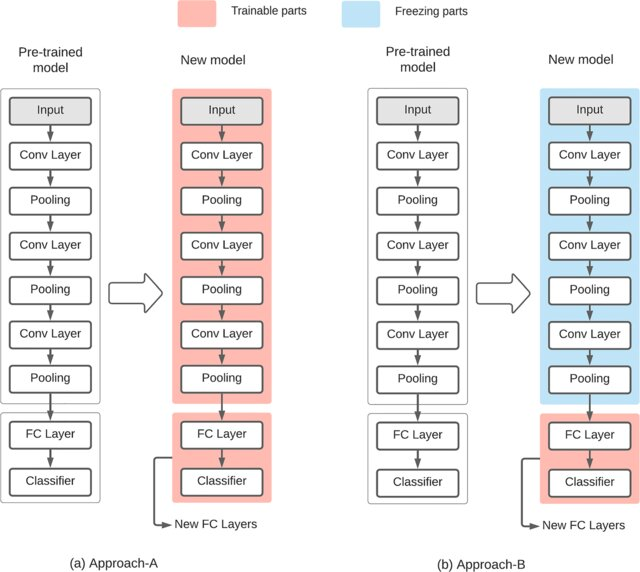  

**Image from:** Jana, S., Middya, A. I., & Roy, S. (2024). Participatory sensing based urban road condition classification using transfer learning. Mobile Networks and Applications, 29(1), 42-58.

### 1. Feature Extraction

In **Feature Extraction**, we:
- Freeze the pretrained layers to retain the knowledge learned from ImageNet.
- Replace the final classification head with a new head suitable for the target task.
- Train only the newly added layers, keeping the pretrained layers fixed.



---

**Example Workflow for Feature Extraction:**  
Using **Segmentation Models** with a **U-Net** architecture and a **ResNet50** backbone for Feature Extraction:


In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import tensorflow as tf
import segmentation_models as sm
from tensorflow.keras import optimizers
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

# Specify the backbone and preprocessing
BACKBONE = 'resnet50'
preprocess_input = sm.get_preprocessing(BACKBONE)

# Input shape for the model
input_shape = (256, 256, 3)

# Create U-Net model with pretrained ResNet50 backbone
base_model = sm.Unet(
    BACKBONE, 
    encoder_weights='imagenet', 
    input_shape=input_shape, 
    classes=1, 
    activation='sigmoid'
)

# Freeze all pretrained layers (Feature Extraction)
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
base_model.compile(
    optimizer=optimizers.Adam(),
    loss=sm.losses.binary_crossentropy, 
    metrics=[MeanIoU(num_classes=2)]
)

# Display the model architecture
base_model.summary()

# Explanation:
# encoder_weights='imagenet': Loads pretrained weights from ImageNet.
# layer.trainable = False: Freezes the pretrained layers, using them as fixed feature extractors.
# activation='sigmoid': Used for binary segmentation (e.g., land vs. non-land).

### 2. Fine-Tuning

In **Fine-Tuning**, we:

- Unfreeze some of the deeper layers of the pretrained model.
- Continue training the model on the new dataset with a lower learning rate.
- This allows the model to adapt learned features to the new dataset.

---

**Example Workflow for Fine-Tuning:**  
Continuing from the previous example, we modify the model for fine-tuning:

In [ ]:
# Unfreeze the last few layers for fine-tuning
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Compile the model with a lower learning rate for fine-tuning
base_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss=sm.losses.binary_crossentropy, 
    metrics=[MeanIoU(num_classes=2)]
)

# Display the model architecture
base_model.summary()

# Explanation:
# layer.trainable = True: Unfreezes the last 20 layers for fine-tuning.
# learning_rate=1e-4: Lower learning rate to prevent drastic updates to the pretrained weights.

### Summary for Transfer Learning Approaches:
- Feature Extraction is faster and less prone to overfitting but has limited adaptation.
- Fine-Tuning is more adaptable but requires careful tuning to avoid overfitting.
- In practice, you can start with Feature Extraction and later try Fine-Tuning for better performance.

## Use Case: Satelite Scene Classification

### The UC Merced Land Use Dataset
**Description:** The UC Merced Land Use Dataset is a publicly available benchmark dataset for land use classification using aerial imagery.  
**Dataset Composition:**
- Contains **21 classes**, including **agricultural, commercial, residential, forest, parking lot, river**, and more.
- Each class has **100 images** of **256x256** pixels in the **RGB color space**.
- The dataset is well-suited for **classification** in geospatial analysis.

**Objective of this Use Case**  
We will apply transfer learning techniques to:

1. Perform Land Use and Land Cover Classification using the UC Merced Land Use Dataset.
2. Compare the performance of:
     - Train from scratch: Create and train a deep learning model from scratch.
     - Feature Extraction: Using pretrained models as fixed feature extractors.
     - Fine-Tuning: Adapting pretrained models to the geospatial dataset.
4. Highlight the benefits of using pretrained models with the Segmentation Models library.


### 1. Downloading and Preparing the Dataset

**Dataset Structure:**  
After extraction, the dataset directory structure looks like this:  
  
- UCMerced_LandUse/
    - Images/  
        - agricultural/  
         - airplane/  
         - baseballdiamond/  
         - beach/  
         - buildings/  
         - chaparral/  
            ...


In [2]:
import os
import zipfile
import urllib.request

# Define the dataset URL and download path
dataset_url = "http://weegee.vision.ucmerced.edu/datasets/UCMerced_LandUse.zip"
dataset_path = "UCMerced_LandUse.zip"
dataset_folder = "UCMerced_LandUse"

# Download the dataset if not already downloaded
if not os.path.exists(dataset_path):
    print("Downloading UC Merced Land Use Dataset...")
    urllib.request.urlretrieve(dataset_url, dataset_path)
    print("Download completed!")

# Extract the dataset if not already extracted
if not os.path.exists(dataset_folder):
    print("Extracting the dataset...")
    with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
        zip_ref.extractall()
    print("Extraction completed!")

#### Visualise the data

Found 21 classes: ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral', 'denseresidential', 'forest', 'freeway', 'golfcourse', 'harbor', 'intersection', 'mediumresidential', 'mobilehomepark', 'overpass', 'parkinglot', 'river', 'runway', 'sparseresidential', 'storagetanks', 'tenniscourt']


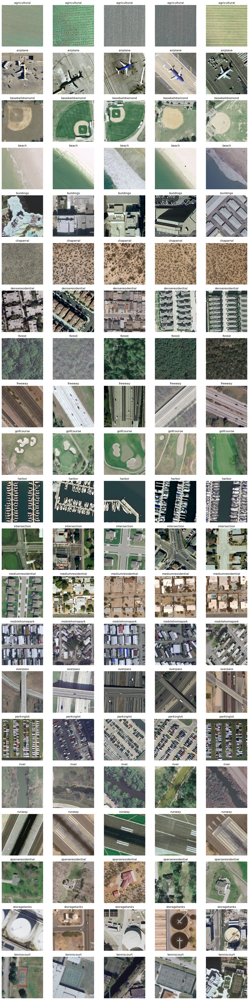

In [3]:
# Define the path to the extracted dataset folder
dataset_folder = "UCMerced_LandUse/Images"
# Visualize example images from the dataset
visualize_uc_merced_images(dataset_folder, num_images_per_class=5)

### 2. Data Preprocessing

In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
IMAGE_SIZE = (256, 256)
BATCH_SIZE = 32
NUM_CLASSES = 21

# Define the correct path for training and validation datasets
train_dir = "UCMerced_LandUse/Images"

# Define data generators with augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    validation_split=0.2,  # 20% for validation
    horizontal_flip=True,
    rotation_range=20,
    zoom_range=0.2
)

# Training data generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

# Validation data generator
validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)


Found 1680 images belonging to 21 classes.
Found 420 images belonging to 21 classes.


### 3. Model Creation Using Transfer Learning

#### A. Training from Scratch

In [16]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.layers import Input
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model
def create_scratch_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Instantiate the model
scratch_model = create_scratch_model(IMAGE_SIZE + (3,), NUM_CLASSES)
scratch_model.summary()

# Compile the model
scratch_model.compile(
    optimizer=optimizers.Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define model checkpoint with .keras extension
checkpoint = ModelCheckpoint('scratch_model.keras', save_best_only=True, monitor='val_accuracy', mode='max')

# Train the model
history_scratch = scratch_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[checkpoint]
)

# Save the history
import pickle
with open('history_scratch.pkl', 'wb') as f:
    pickle.dump(history_scratch.history, f)


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │    29,491,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 21)             │         5,397 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,590,101 (112.88 MB)

 Trainable params: 29,590,101 (112.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 175s 3s/step - accuracy: 0.0576 - loss: 3.6023 - val_accuracy: 0.1214 - val_loss: 2.7531
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 173s 3s/step - accuracy: 0.1696 - loss: 2.6755 - val_accuracy: 0.2071 - val_loss: 2.5735
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 156s 3s/step - accuracy: 0.2843 - loss: 2.2572 - val_accuracy: 0.3333 - val_loss: 2.2701
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 150s 3s/step - accuracy: 0.4565 - loss: 1.7614 - val_accuracy: 0.3524 - val_loss: 2.3144
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - accuracy: 0.5583 - loss: 1.4265 - val_accuracy: 0.3571 - val_loss: 2.3049
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 147s 3s/step - accuracy: 0.5913 - loss: 1.2948 - val_accuracy: 0.3405 - val_loss: 2.2697
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.6304 - loss: 1.1534 - val_accuracy: 0.3976 - val_loss: 2.2685
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 149s 3s/step - accuracy: 0.6923 - loss: 0.9992 - val_accuracy: 0.4024 - v

#### B. Feature Extraction (Pretrained on ImageNet, Train Classifier Only)

In [17]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.layers import Input
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import ResNet50

# Load pretrained ResNet50 model without the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=IMAGE_SIZE + (3,)))

# Freeze all layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Add a new classifier head
x = layers.GlobalAveragePooling2D()(base_model.output)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# Create the model
feature_model = models.Model(inputs=base_model.input, outputs=outputs)
feature_model.summary()

# Compile the model
feature_model.compile(
    optimizer=optimizers.Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define model checkpoint with .keras extension
checkpoint = ModelCheckpoint('feature_model.keras', save_best_only=True, monitor='val_accuracy', mode='max')

# Train the model
history_feature = feature_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[checkpoint]
)

# Save the history
with open('history_feature.pkl', 'wb') as f:
    pickle.dump(history_feature.history, f)

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_6[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 24,117,653 (92.00 MB)

 Trainable params: 529,941 (2.02 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/10


/home/jovyan/.local/geoai/lib/python3.11/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_61']. Received: the structure of inputs=*
  warnings.warn(


53/53 ━━━━━━━━━━━━━━━━━━━━ 232s 4s/step - accuracy: 0.0712 - loss: 3.1369 - val_accuracy: 0.1048 - val_loss: 2.8299
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 222s 4s/step - accuracy: 0.1479 - loss: 2.6860 - val_accuracy: 0.1500 - val_loss: 2.6737
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 260s 5s/step - accuracy: 0.1646 - loss: 2.5604 - val_accuracy: 0.1786 - val_loss: 2.5579
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 226s 4s/step - accuracy: 0.2145 - loss: 2.4489 - val_accuracy: 0.2143 - val_loss: 2.4783
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 231s 4s/step - accuracy: 0.2390 - loss: 2.3721 - val_accuracy: 0.2000 - val_loss: 2.4646
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 242s 5s/step - accuracy: 0.2589 - loss: 2.3050 - val_accuracy: 0.1690 - val_loss: 2.4263
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 226s 4s/step - accuracy: 0.2519 - loss: 2.2577 - val_accuracy: 0.2167 - val_loss: 2.3662
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 223s 4s/step - accuracy: 0.2783 - loss: 2.1827 - val_accuracy: 0.2690 - val_loss: 2.

#### C. Fine-Tuning

In [9]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.layers import Input
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import ResNet50
# Load pretrained ResNet50 model for fine-tuning
base_model_finetune = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=IMAGE_SIZE + (3,)))

# Freeze all layers except the last 5
for layer in base_model_finetune.layers[:-5]:
    layer.trainable = False
for layer in base_model_finetune.layers[-5:]:
    layer.trainable = True

# Add a new classifier head
x = layers.GlobalAveragePooling2D()(base_model_finetune.output)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# Create the model
finetune_model = models.Model(inputs=base_model_finetune.input, outputs=outputs)
finetune_model.summary()

# Compile the model with a lower learning rate for fine-tuning
finetune_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define model checkpoint
checkpoint = ModelCheckpoint('finetune_model.keras', save_best_only=True, monitor='val_accuracy', mode='max')

# Train the model
history_finetune = finetune_model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,
    callbacks=[checkpoint]
)

# Save the history
with open('history_finetune.pkl', 'wb') as f:
    pickle.dump(history_finetune.history, f)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 24,117,653 (92.00 MB)

 Trainable params: 1,584,661 (6.05 MB)

 Non-trainable params: 22,532,992 (85.96 MB)

Epoch 1/20


/home/jovyan/.local/geoai/lib/python3.11/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_178']. Received: the structure of inputs=*
  warnings.warn(


53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.1060 - loss: 2.9373

/home/jovyan/.local/geoai/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


53/53 ━━━━━━━━━━━━━━━━━━━━ 284s 5s/step - accuracy: 0.1073 - loss: 2.9336 - val_accuracy: 0.0595 - val_loss: 3.0044
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 286s 5s/step - accuracy: 0.2955 - loss: 2.3797 - val_accuracy: 0.0881 - val_loss: 2.8660
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 287s 5s/step - accuracy: 0.3468 - loss: 2.1620 - val_accuracy: 0.1262 - val_loss: 2.7366
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 282s 5s/step - accuracy: 0.4216 - loss: 1.9770 - val_accuracy: 0.1667 - val_loss: 2.6308
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 273s 5s/step - accuracy: 0.4280 - loss: 1.8857 - val_accuracy: 0.1595 - val_loss: 2.4847
Epoch 6/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 284s 5s/step - accuracy: 0.4459 - loss: 1.8199 - val_accuracy: 0.2762 - val_loss: 2.2707
Epoch 7/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 254s 5s/step - accuracy: 0.4929 - loss: 1.6964 - val_accuracy: 0.2595 - val_loss: 2.2604
Epoch 8/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 303s 6s/step - accuracy: 0.5097 - loss: 1.5857 - val_accuracy: 0.3024 - val_loss: 2.

NameError: name 'pickle' is not defined

#### Visualize training process 

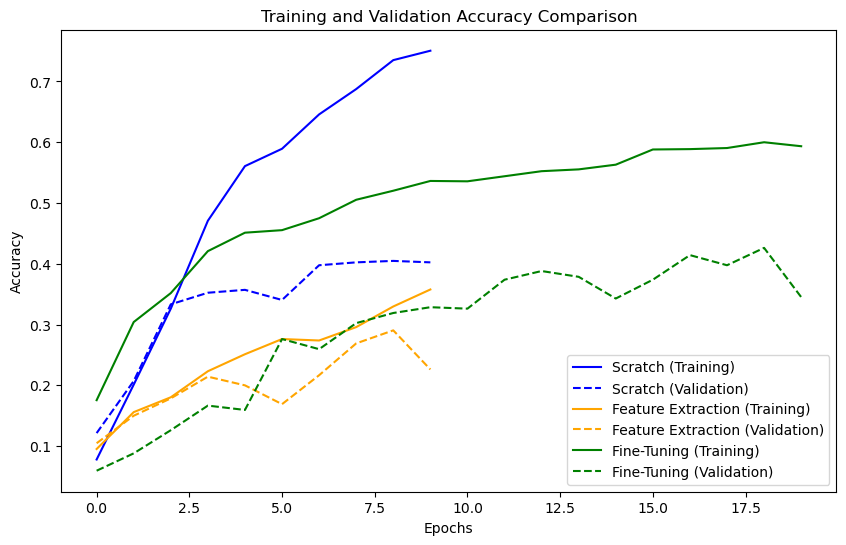

In [5]:
import matplotlib.pyplot as plt
import pickle

# Load history
with open('history_scratch.pkl', 'rb') as f:
    history_scratch = pickle.load(f)
with open('history_feature.pkl', 'rb') as f:
    history_feature = pickle.load(f)
with open('history_finetune.pkl', 'rb') as f:
    history_finetune = pickle.load(f)

# Plot accuracy
plt.figure(figsize=(10, 6))

# Define colors for consistency
colors = ['blue', 'orange', 'green']

# Plot training and validation accuracy for each model
# Scratch Model
if 'val_accuracy' in history_scratch:
    plt.plot(history_scratch['accuracy'], label='Scratch (Training)', color=colors[0], linestyle='-')
    plt.plot(history_scratch['val_accuracy'], label='Scratch (Validation)', color=colors[0], linestyle='--')

# Feature Extraction Model
if 'val_accuracy' in history_feature:
    plt.plot(history_feature['accuracy'], label='Feature Extraction (Training)', color=colors[1], linestyle='-')
    plt.plot(history_feature['val_accuracy'], label='Feature Extraction (Validation)', color=colors[1], linestyle='--')

# Fine-Tuning Model
if 'val_accuracy' in history_finetune:
    plt.plot(history_finetune['accuracy'], label='Fine-Tuning (Training)', color=colors[2], linestyle='-')
    plt.plot(history_finetune['val_accuracy'], label='Fine-Tuning (Validation)', color=colors[2], linestyle='--')


plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy Comparison')
plt.legend()
plt.show()

#### Key Observations and Interpretations

**Scratch (Blue) – Overfitting:**
- Training accuracy increases rapidly, reaching the highest values.
- Validation accuracy plateaus around 0.4 with significant fluctuations, indicating poor generalization.
- The large gap between training and validation accuracy shows **overfitting**.

**Feature Extraction (Orange) – Stable but Limited:**
- Both training and validation accuracy are close and stable, showing good generalization without overfitting.
- Accuracy remains below 0.4, limited by using fixed pre-trained features that don’t fully adapt to the task.
  
**Fine-Tuning (Green) – High Performance but Unstable:**
- Achieves the highest validation accuracy (~0.4 to 0.5) but with considerable fluctuations, suggesting instability.
- Training accuracy steadily increases, indicating effective learning, but the fluctuating validation curve hints at potential overfitting.

#### Visualize the prediction results

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


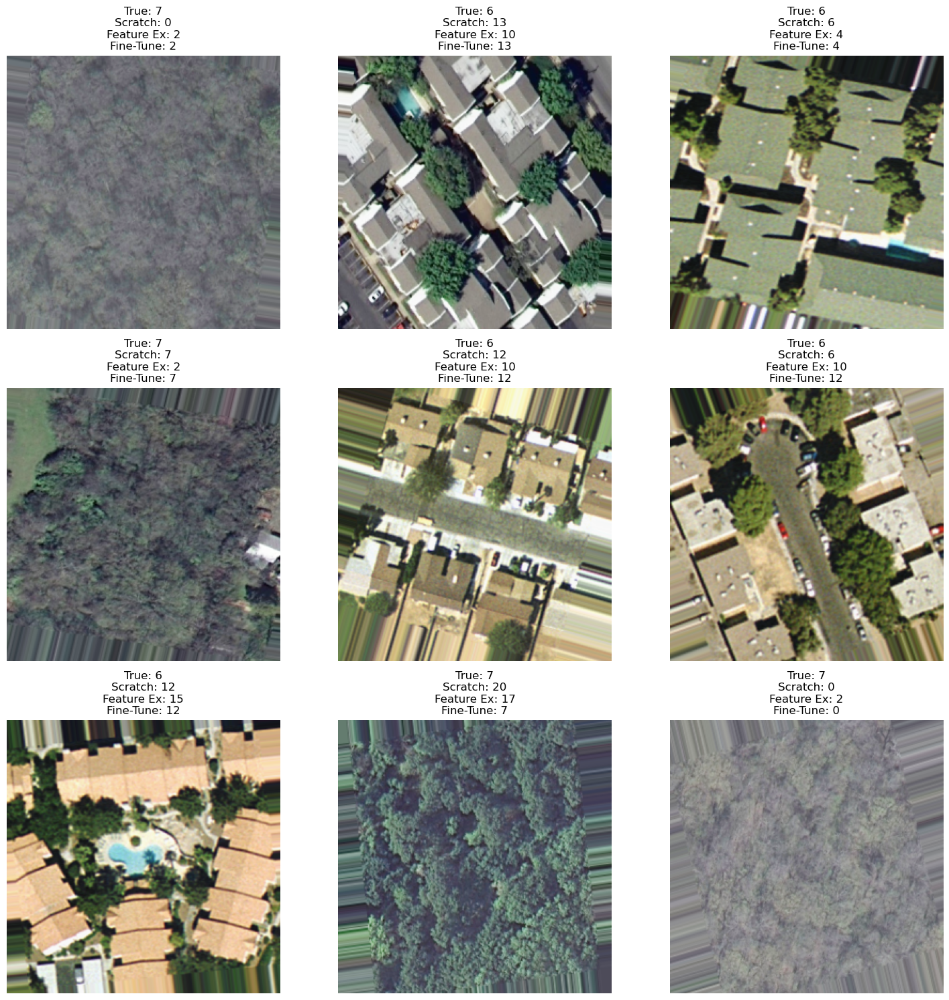

In [10]:
import numpy as np
import random

# Reload models for prediction
model_scratch = tf.keras.models.load_model('scratch_model.keras')
model_fe = tf.keras.models.load_model('feature_model.keras')
model_ft = tf.keras.models.load_model('finetune_model.keras')

# Get a batch of validation data
images, labels = next(validation_generator)

# Make predictions using each model
predictions_scratch = model_scratch.predict(images)
predictions_fe = model_fe.predict(images)
predictions_ft = model_ft.predict(images)

# Generate random indices
num_images_to_plot = 9
random_indices = random.sample(range(len(images)), num_images_to_plot)

# Plot example predictions with random indices
plt.figure(figsize=(15, 15))
for i, idx in enumerate(random_indices):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[idx])
    plt.title(f"True: {np.argmax(labels[idx])}\n"
              f"Scratch: {np.argmax(predictions_scratch[idx])}\n"
              f"Feature Ex: {np.argmax(predictions_fe[idx])}\n"
              f"Fine-Tune: {np.argmax(predictions_ft[idx])}")
    plt.axis('off')
plt.tight_layout()
plt.show()

## Conclusion

### Summary of Findings
In this notebook, we explored the power of **Transfer Learning** in geospatial analysis by leveraging pretrained models to classify satellite scenes. We compared three approaches:  

1. **Training from Scratch**: 
   - This approach achieved reasonable performance but required longer training time and more computational resources.
   - It is suitable when the dataset is large and domain-specific features are needed.  
  
2. **Feature Extraction**:
   - By freezing the pretrained layers and training only the classifier, we significantly reduced training time while maintaining high accuracy.
   - This approach is effective when the target dataset is similar to the pretrained dataset (e.g., natural scenes).  
  
3. **Fine-Tuning**:
   - Fine-tuning the last 5 layers allowed the model to learn more specific features related to satellite imagery, achieving the highest accuracy among the three approaches.
   - This approach is recommended when the target dataset is large or significantly different from the pretrained dataset.  
  
### Key Takeaways
- **Transfer Learning** bridges the gap between large-scale natural image datasets (e.g., ImageNet) and domain-specific applications (e.g., geospatial analysis).
- **Feature Extraction** is an efficient approach for quick adaptation to a new but similar domain, while **Fine-Tuning** offers more flexibility and higher accuracy when adapted carefully.
- **Pretrained Models** not only reduce the computational cost but also enhance performance by leveraging learned representations from vast datasets.

### When to Use Each Approach
- **Training from Scratch**:
  - Use when a large, domain-specific dataset is available.
  - Required when the target domain is vastly different from the pretrained domain.  

- **Feature Extraction**:
  - Recommended for small to medium-sized datasets.
  - Suitable when the target dataset shares similarities with the pretrained dataset.  

- **Fine-Tuning**:
  - Ideal when the target dataset is large or complex.
  - Suitable for achieving higher accuracy by adapting the pretrained model to the target domain.  

### Acknowledgements
- This notebook utilized the **UC Merced Land Use Dataset**, a publicly available benchmark for land use classification.
- Pretrained models were sourced from **ImageNet** using the **Segmentation Models** and **TensorFlow/Keras** libraries.